## Fastica_Artificial

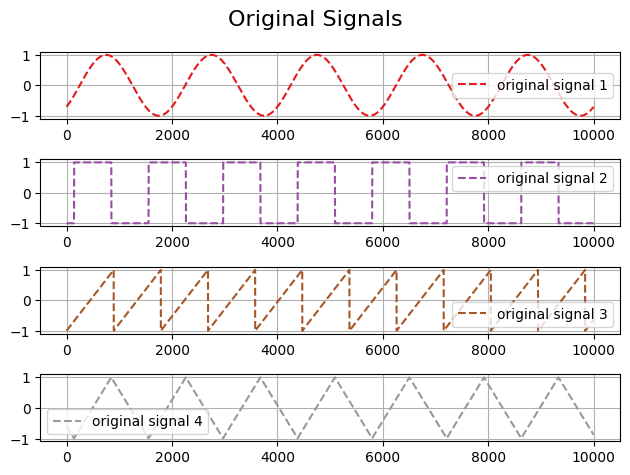

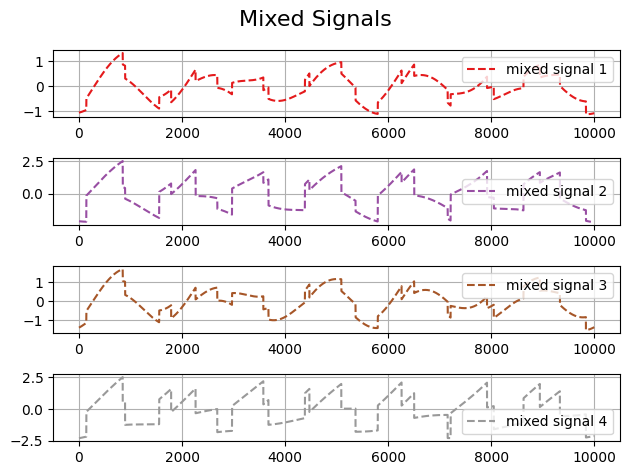

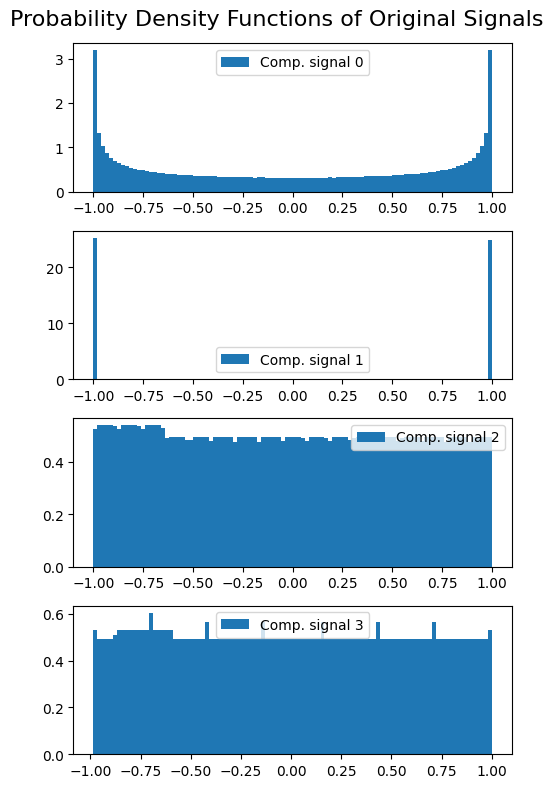

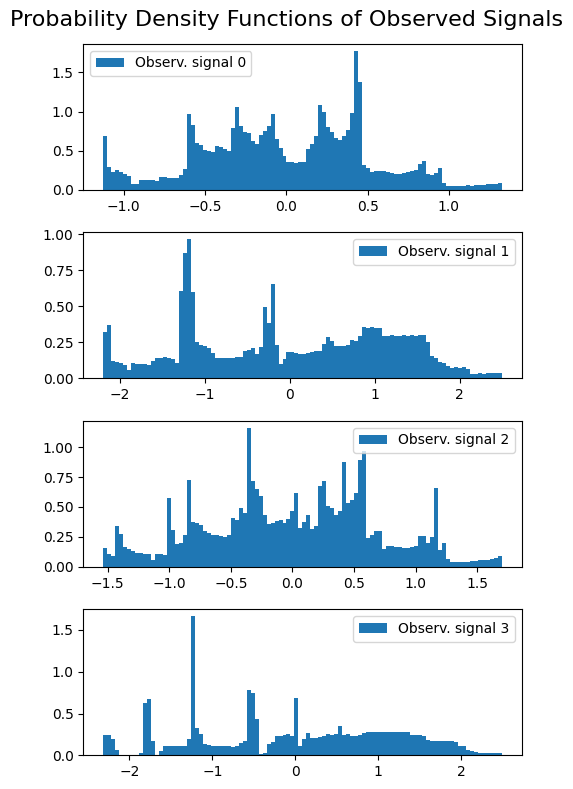

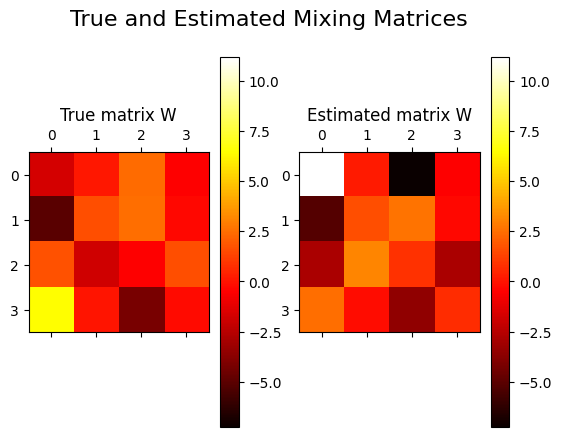

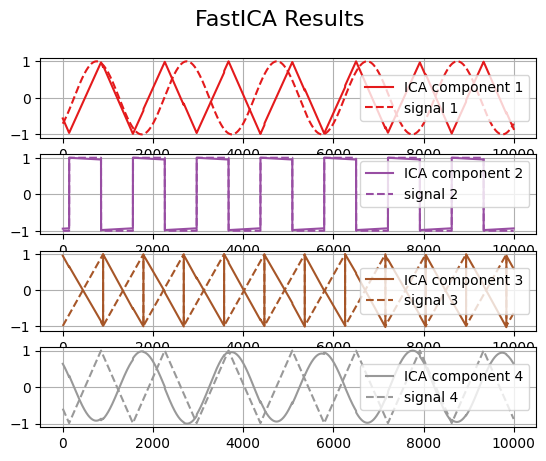

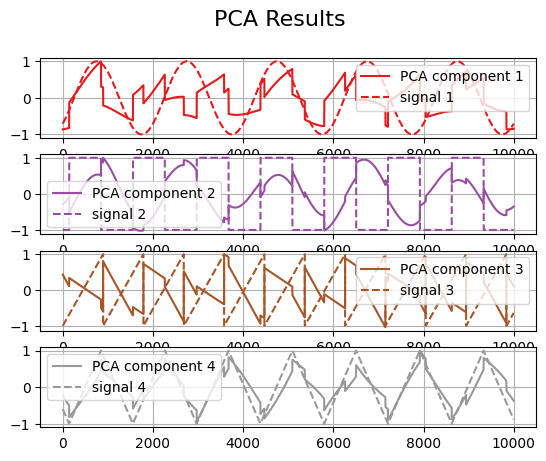

In [49]:
# FastICA on an artificial example

import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from sklearn.decomposition import FastICA, PCA
from matplotlib.pyplot import cm

np.random.seed(50)  # set the seed to reproduce the experiment

plt.close('all')
#%% Generate the signals
N = 10000 # number of samples
N_signals = 4
time = np.linspace(0, 10, N) # generate the time axis (seconds)
time.resize(1, N)
freq1 = 0.5 # main frequency (Hz)
freq2 = freq1 * np.sqrt(2)
freq3 = freq1 * np.sqrt(5)
x1 = np.sin(2 * np.pi * freq1 * time - np.pi / 4)  # Signal 1: sinusoidal signal
x2 = np.sign(np.sin(2 * np.pi * freq2 * time - np.pi / 5))  # Signal 2: square wave
x3 = signal.sawtooth(2 * np.pi * freq3 * time)  # Signal 3: saw tooth signal
x4 = np.cumsum(x2)
x4 = (x4 - x4.mean()) / x4.std()
x4 = x4 / x4.max()
x4.resize(1, N) # Signal 4: triangular signal

X = np.concatenate((x1, x2, x3, x4), axis=0) # shape: 4 rows, N columns
color = iter(cm.Set1(np.linspace(0, 1, N_signals)))

# Plot original signals
plt.figure()
plt.suptitle("Original Signals", fontsize=16)  # Add title
for n in range(N_signals):
    c = next(color)
    plt.subplot(N_signals, 1, 1 + n)
    plt.plot(X[n, :], '--', color=c, label='original signal ' + str(n + 1))
    plt.grid()
    plt.legend()
plt.tight_layout()

#%% Generate the observed data
A = np.random.rand(N_signals, N_signals)  # true weight matrix (random)
Y = np.dot(A, X)  # observed data, shape: 4 rows, N columns
W = np.linalg.inv(A)

# Plot mixed signals
color = iter(cm.Set1(np.linspace(0, 1, N_signals)))
plt.figure()
plt.suptitle("Mixed Signals", fontsize=16)  # Add title
for n in range(N_signals):
    c = next(color)
    plt.subplot(N_signals, 1, 1 + n)
    plt.plot(Y[n, :], '--', color=c, label='mixed signal ' + str(n + 1))
    plt.grid()
    plt.legend()
plt.tight_layout()

#%% Reshape data
X = X.T # shape: N rows, 4 columns
Y = Y.T # shape: N rows, 4 columns

#%% Look at the pdfs
plt.figure(figsize=(5, 8))
plt.suptitle("Probability Density Functions of Original Signals", fontsize=16)  # Add title
for n in range(N_signals):
    plt.subplot(N_signals, 1, 1 + n)
    plt.hist(X[:, n], bins=100, density=True, label='Comp. signal ' + str(n))
    plt.legend()
plt.tight_layout()

plt.figure(figsize=(5, 8))
plt.suptitle("Probability Density Functions of Observed Signals", fontsize=16)  # Add title
for n in range(N_signals):
    plt.subplot(N_signals, 1, 1 + n)
    plt.hist(Y[:, n], bins=100, density=True, label='Observ. signal ' + str(n))
    plt.legend()
plt.tight_layout()

#%% Use FastICA
ica = FastICA(n_components=N_signals, algorithm="deflation", whiten="unit-variance")
XhatICA = ica.fit_transform(Y)  # Reconstruct indep signals from observations
Ahat = ica.mixing_  # estimated A
What = ica.components_ # estimated matrix W: Xhat=np.dot(Y,ica.components_.T)

vm1 = W.min()
VM1 = W.max()
vm2 = What.min()
VM2 = What.max()
vm = np.min([vm1, vm2])
VM = np.max([VM1, VM2])

plt.figure()
plt.suptitle("True and Estimated Mixing Matrices", fontsize=16)  # Add title
plt.subplot(1, 2, 1)
plt.matshow(W, fignum=0, vmin=vm, vmax=VM, cmap='hot')
plt.colorbar()
plt.title('True matrix W')
plt.subplot(1, 2, 2)
plt.matshow(What, fignum=0, vmin=vm, vmax=VM, cmap='hot')
plt.colorbar()
plt.title('Estimated matrix W')

#%% Use PCA
pca = PCA(n_components=N_signals)
XhatPCA = pca.fit_transform(Y)  # Reconstruct signals based on orthogonal components

#%% Plot the results for FastICA
color = iter(cm.Set1(np.linspace(0, 1, N_signals)))
plt.figure()
plt.suptitle("FastICA Results", fontsize=16)  # Add title
for n in range(N_signals):
    c = next(color)
    plt.subplot(N_signals, 1, 1 + n)
    plt.plot(XhatICA[:, n] / np.max(XhatICA[:, n]), '-', color=c, label='ICA component ' + str(n + 1))
    plt.plot(X[:, n] / np.max(X[:, n]), '--', color=c, label='signal ' + str(n + 1))
    plt.grid()
    plt.legend()

#%% Plot the results for PCA
color = iter(cm.Set1(np.linspace(0, 1, N_signals)))
plt.figure()
plt.suptitle("PCA Results", fontsize=16)  # Add title
for n in range(N_signals):
    c = next(color)
    plt.subplot(N_signals, 1, 1 + n)
    plt.plot(XhatPCA[:, n] / np.max(XhatPCA[:, n]), '-', color=c, label='PCA component ' + str(n + 1))
    plt.plot(X[:, n] / np.max(X[:, n]), '--', color=c, label='signal ' + str(n + 1))
    plt.grid()
    plt.legend()


## Central Limit Theorem

p-value for the z-score is  0.7653670728350339
absolute value of t-score for x is  0.9703316860853826
absolute vlue of excess kurtosis for x is  0.20553776565486093
Anderson-Darling test a^2 for x is  1.1034940083560514


Text(0.5, 1.0, 'Anderson-Darling test')

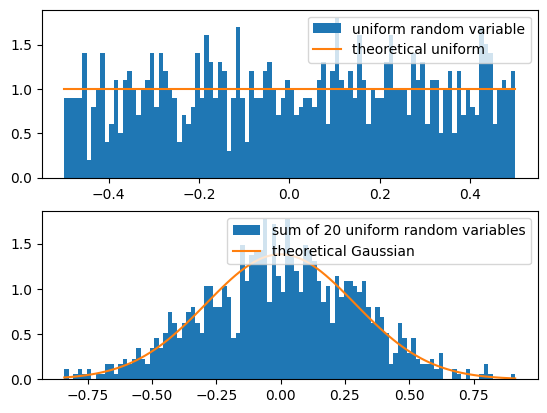

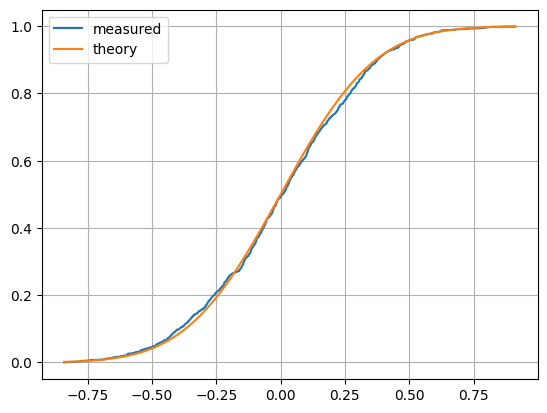

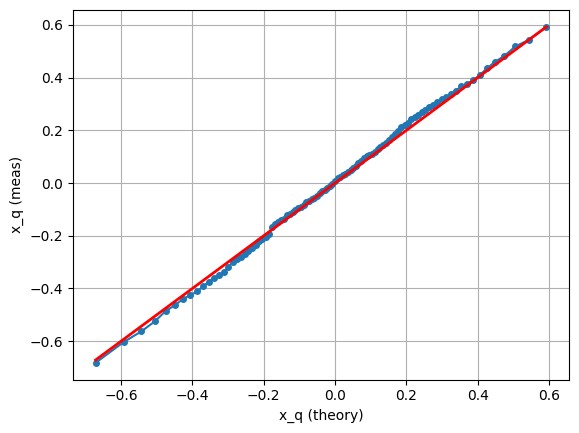

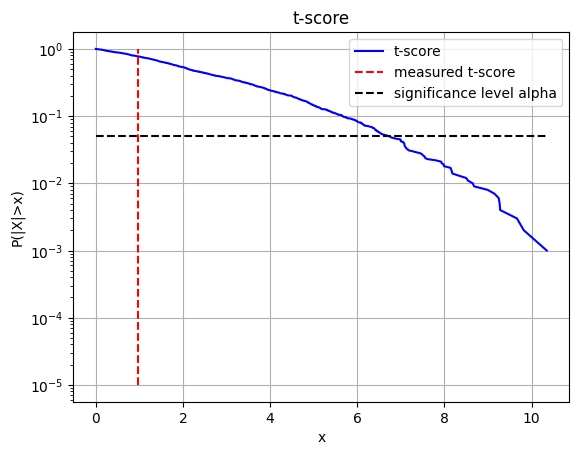

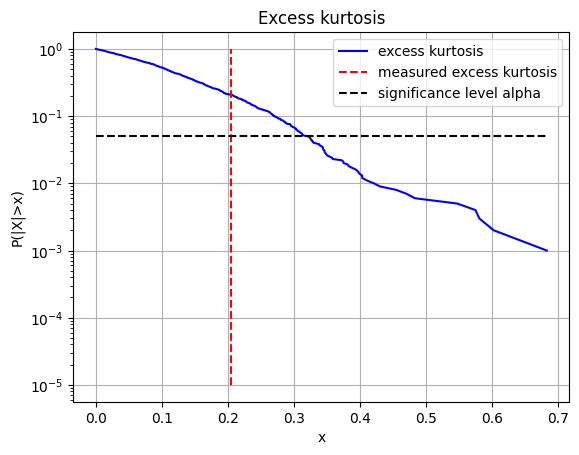

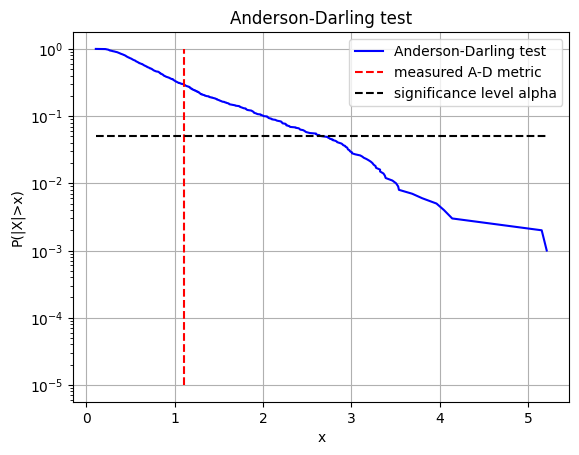

In [50]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.special import erfc, erfcinv
#%%
#np.random.seed(30)  # set the seed to reproduce the experiment
plt.close('all')
N=20 # number of independent uniform random variables
Nsamp=1000
xUnif=np.random.rand(Nsamp,N)-0.5 # uniformly distributed in -0.5,0.5 (variance = 1/12)
mu=0
sigma=np.sqrt(1/12)

x=np.sum(xUnif,axis=1)/np.sqrt(N)
plt.figure()
plt.subplot(2,1,1)
u=plt.hist(xUnif[:,0],bins=100,density=True,label='uniform random variable')
pdf=stats.uniform.pdf(x = u[1],loc=-0.5, scale=1)#Compute the theoretical uniform pdf
plt.plot(u[1],pdf,label='theoretical uniform')
plt.legend()
plt.subplot(2,1,2)
a=plt.hist(x,bins=100,density=True,label='sum of '+str(N)+' uniform random variables')
pdf = stats.norm.pdf(x = a[1], loc=mu, scale=sigma) #Compute the theoretical Gaussian pdf
plt.plot(a[1],pdf,label='theoretical Gaussian')
plt.legend()

#%% measured versus theoretical CDF
xs = np.sort(x)
y = np.arange(Nsamp)/Nsamp
plt.figure()
plt.plot(xs,y,label='measured')
plt.plot(xs,1-0.5*erfc((xs-mu)/(np.sqrt(2)*sigma)),label='theory')
plt.legend()
plt.grid()
#%% q-q plot
percentiles = np.arange(0,99,1)
qs=percentiles/100
ii = np.floor(qs*Nsamp).astype(int)
xqs = (xs[ii]+xs[ii+1])/2
xqs_theory = np.sqrt(2)*sigma*erfcinv(2*(1-qs))+mu
plt.figure()
plt.plot(xqs_theory,xqs,'-o',markersize=4)
plt.plot(xqs_theory,xqs_theory,'r',linewidth=2)
plt.xlabel('x_q (theory)')
plt.ylabel('x_q (meas)')
plt.grid()
#%% z-score
z=(np.mean(x)-mu)/sigma*np.sqrt(Nsamp)
p_value = erfc(z/np.sqrt(2))
print('p-value for the z-score is ',p_value)
#%% t-score
def tsco(x):
    m = np.mean(x)
    s = np.sum((x-m)**2)/(Nsamp-1)
    t = (m-mu)/s*np.sqrt(Nsamp)
    return t
t = tsco(x)
print('absolute value of t-score for x is ',np.abs(t))
#%% excess kurtosis
def exc_kurt(x):
    N=len(x)
    m=np.sum(x)/N
    s4=np.sum((x-m)**4)/N
    s2=np.sum((x-m)**2)/N
    k0=s4/s2**2
    A = (N-1)/(N-2)/(N-3)*((N+1)*k0-3*(N-1));
    return A
ku = exc_kurt(x)
print('absolute vlue of excess kurtosis for x is ',np.abs(ku))
#%% Anderson-Darling test
def A_D(x,mu,sigma):
# -N -\sum_{i=1}^{N}\frac{2i-1}{N} \left[ \ln
# F(y_i)+\ln(1-F(y_{N+1-i}))\right]
    N = len(x)
    xsd = -np.sort(-x)
    Fd = 1-0.5*erfc((xsd-mu)/np.sqrt(2)/sigma);
    Fu = np.flipud(Fd);
    ii=np.arange(1,N+1)
    a=(2*ii-1)/N;
    out = -N-a@(np.log(Fu)+np.log(1-Fd));
    return out
a2 = A_D(x,mu,sigma)
print('Anderson-Darling test a^2 for x is ',a2)
#%% estimate p-values for the chosen statistics using simulation
Nexp = 1000#number of experiments to generate the p-value curve
valT = np.zeros((Nexp,))
valKurt = np.zeros((Nexp,))
valA_D = np.zeros((Nexp,))
for k in range(Nexp):
    xg = np.random.randn(Nsamp)*sigma + mu # hypothesis H_0 is satisfied
    valT[k] = tsco(xg)# find t-score for vector xg that satisfies hypothesis H_0
    valKurt[k] = exc_kurt(xg) # find kurtosis for vector xg that satisfies hypothesis H_0
    valA_D[k] = A_D(xg,mu,sigma)# find A_D for vector xg that satisfies hypothesis H_0
#%% final plots to check Gaussianity from p-values (two-tail p-value)
plt.figure()
v1 = np.min(np.abs(valT))
v2 = np.max(np.abs(valT))
plt.semilogy(np.sort(np.abs(valT)),1-np.arange(Nexp)/Nexp,'b',label = 't-score')
plt.semilogy([np.abs(t),np.abs(t)],[1e-5,1],'r--',label = 'measured t-score')
plt.semilogy([v1,v2],[0.05,0.05],'k--',label = 'significance level alpha')
plt.grid()
plt.xlabel('x')
plt.ylabel('P(|X|>x)')
plt.legend()
plt.title('t-score')

plt.figure()
v1 = np.min(np.abs(valKurt))
v2 = np.max(np.abs(valKurt))
plt.semilogy(np.sort(np.abs(valKurt)),1-np.arange(Nexp)/Nexp,'b',label = 'excess kurtosis')
plt.semilogy([np.abs(ku),np.abs(ku)],[1e-5,1],'r--',label = 'measured excess kurtosis')
plt.semilogy([v1,v2],[0.05,0.05],'k--',label = 'significance level alpha')
plt.grid()
plt.xlabel('x')
plt.ylabel('P(|X|>x)')
plt.legend()
plt.title('Excess kurtosis')

plt.figure()
v1 = np.min(np.abs(valA_D))
v2 = np.max(np.abs(valA_D))
plt.semilogy(np.sort(np.abs(valA_D)),1-np.arange(Nexp)/Nexp,'b',label = 'Anderson-Darling test')
plt.semilogy([a2,a2],[1e-5,1],'r--',label = 'measured A-D metric')
plt.semilogy([v1,v2],[0.05,0.05],'k--',label = 'significance level alpha')
plt.grid()
plt.xlabel('x')
plt.ylabel('P(|X|>x)')
plt.legend()
plt.title('Anderson-Darling test')

    


## EEG 1

In [51]:
%pip install mne


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [52]:
import mne

# Load the EEGLAB dataset containing epochs
file_path = "/Users/graybook/Documents/Projects/Polito/Health/lab 6/eeglab2024.2/sample_data/eeglab_data_epochs_ica.set"
epochs = mne.io.read_epochs_eeglab(file_path)

# Print dataset info
print(epochs)


Extracting parameters from /Users/graybook/Documents/Projects/Polito/Health/lab 6/eeglab2024.2/sample_data/eeglab_data_epochs_ica.set...
Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated
Ready.
<EpochsEEGLAB | 80 events (all good), -1 – 1.992 s (baseline off), ~7.5 MiB, data loaded,
 'square/square/rt': 2
 'square/rt': 73
 'square': 5>


/var/folders/r5/tmz4tmxn6s5f_cnt2d3y0pv00000gn/T/ipykernel_48657/2579856252.py:5: RuntimeWarning: At least one epoch has multiple events. Only the latency of the first event will be retained.
  epochs = mne.io.read_epochs_eeglab(file_path)
/var/folders/r5/tmz4tmxn6s5f_cnt2d3y0pv00000gn/T/ipykernel_48657/2579856252.py:5: RuntimeWarning: Not setting positions of 2 eog channels found in montage:
['EOG1', 'EOG2']
Consider setting the channel types to be of EEG/sEEG/ECoG/DBS/fNIRS using inst.set_channel_types before calling inst.set_montage, or omit these channels when creating your montage.
  epochs = mne.io.read_epochs_eeglab(file_path)


In [53]:
# Set EOG channels
epochs.set_channel_types({'EOG1': 'eog', 'EOG2': 'eog'})

# Check the updated info
print(epochs.info)


<Info | 8 non-empty values
 bads: []
 ch_names: FPz, EOG1, F3, Fz, F4, EOG2, FC5, FC1, FC2, FC6, T7, C3, C4, Cz, ...
 chs: 30 EEG, 2 EOG
 custom_ref_applied: False
 dig: 33 items (3 Cardinal, 30 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 32
 projs: []
 sfreq: 128.0 Hz
>


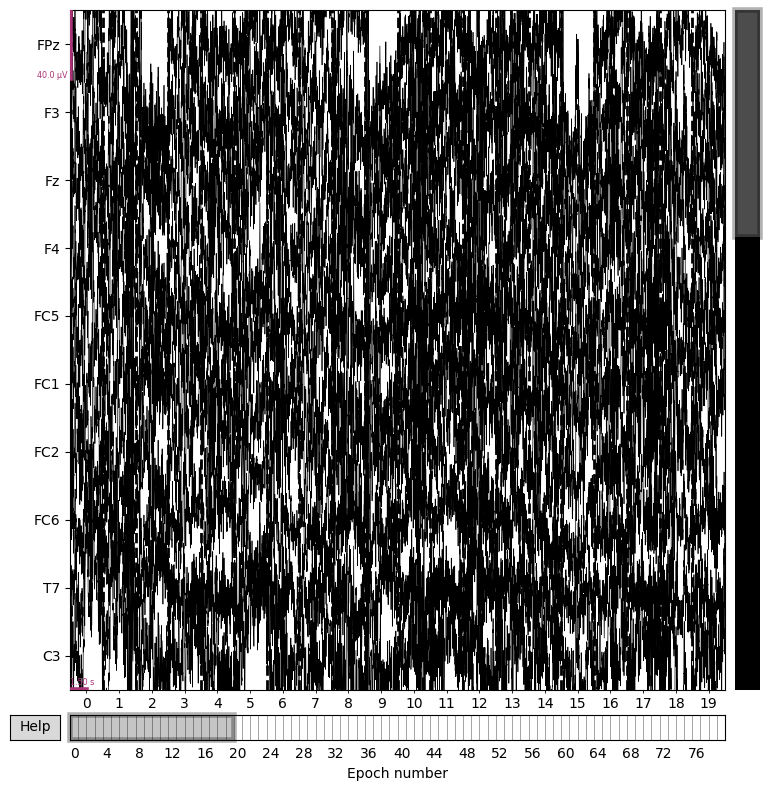

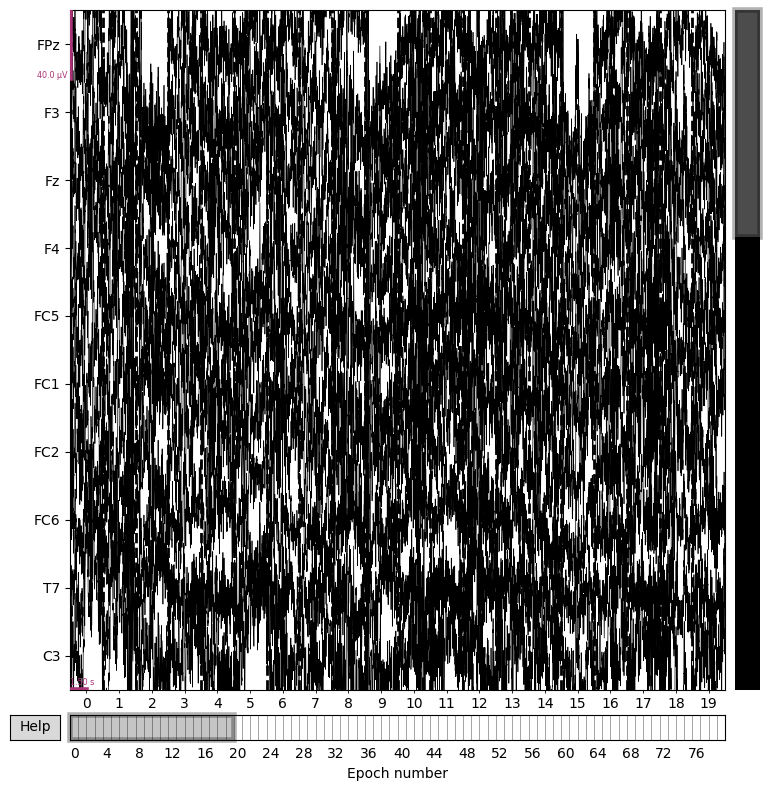

In [54]:
# Adjust scalings for better visualization
scalings = {'eeg': 20e-6, 'eog': 50e-6}  # Adjust as needed
epochs.plot(title="EEG Signals (Adjusted Scaling)", n_channels=10, scalings=scalings, show=True)


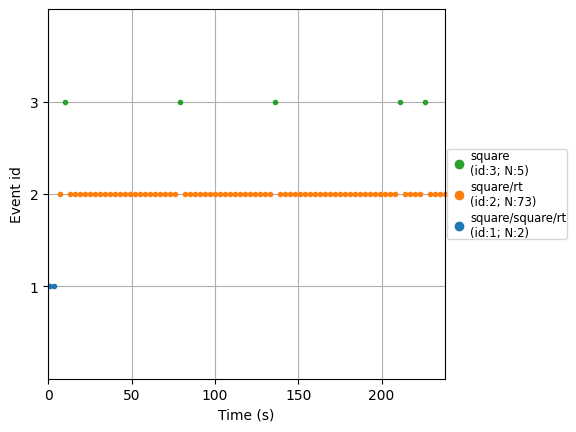

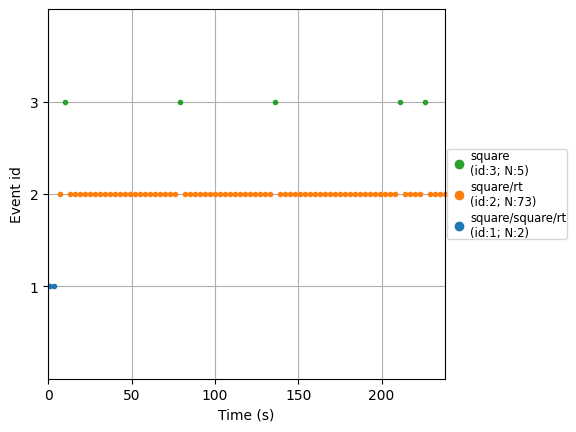

In [56]:
# Plot the events
events = epochs.events  # Extract events from the epochs
event_id = epochs.event_id  # Extract event IDs

# Visualize the events
mne.viz.plot_events(events, sfreq=epochs.info['sfreq'], event_id=event_id)


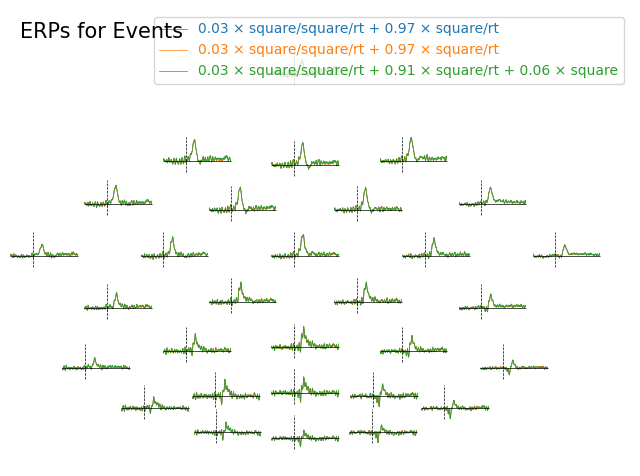

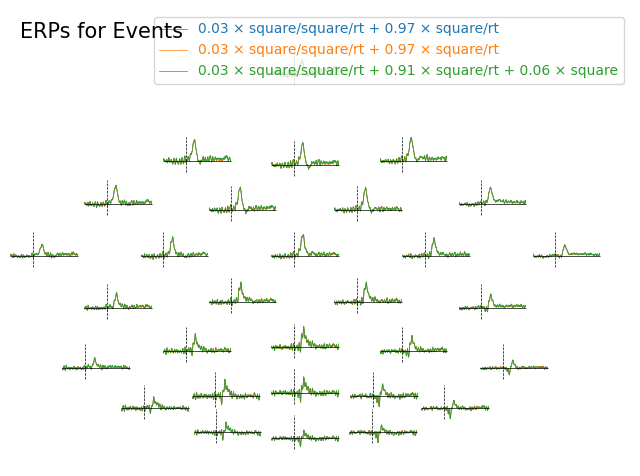

In [57]:
# Compute ERPs for each event type
evokeds = {event: epochs[event].average() for event in epochs.event_id}

# Plot ERPs for all event types with a smaller title
mne.viz.plot_evoked_topo(list(evokeds.values()), title="ERPs for Events")

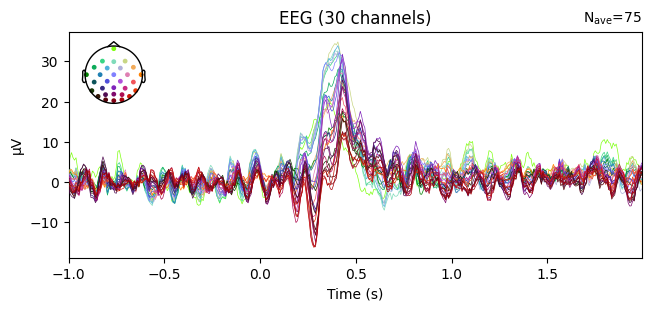

<Figure size 640x480 with 0 Axes>

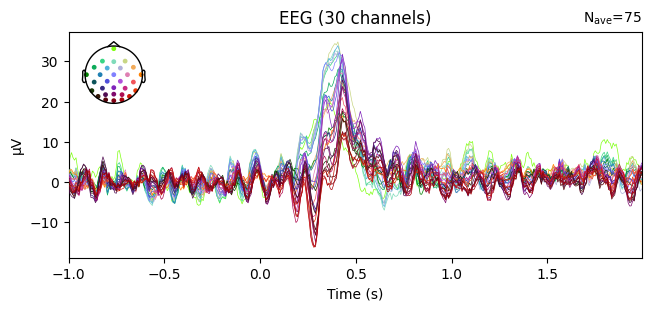

<Figure size 640x480 with 0 Axes>

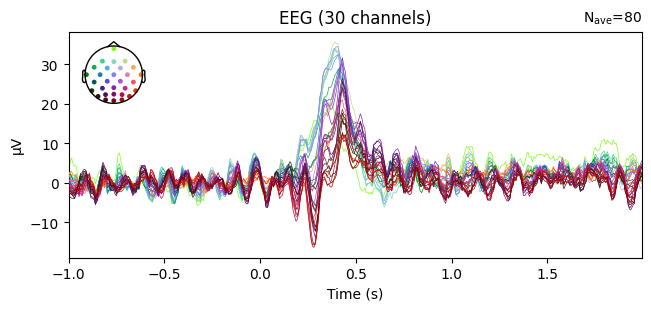

<Figure size 640x480 with 0 Axes>

In [58]:
import matplotlib.pyplot as plt

# Compute ERPs for each event type
evokeds = {event: epochs[event].average() for event in epochs.event_id}

# Plot ERPs for all event types with event names as titles
for event, evoked in evokeds.items():
    fig = evoked.plot(spatial_colors=True)  # Plot ERP for the event
    plt.suptitle(f"ERP for Event: {event}", fontsize=16)  # Add the title


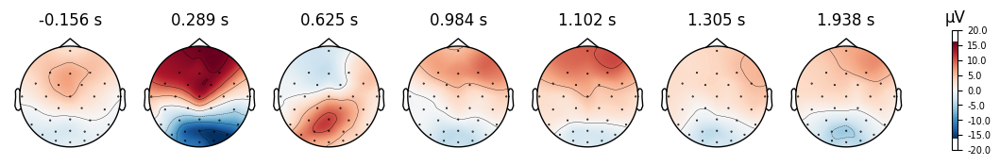

<Figure size 640x480 with 0 Axes>

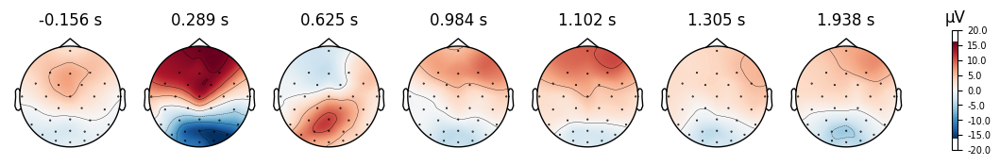

<Figure size 640x480 with 0 Axes>

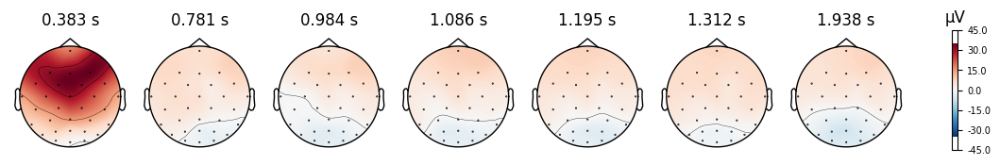

<Figure size 640x480 with 0 Axes>

In [59]:
import matplotlib.pyplot as plt

# Plot scalp maps for the ERPs
for event, evoked in evokeds.items():
    evoked.plot_topomap(times='peaks', time_unit='s')
    plt.suptitle(f"Scalp Map for {event}", fontsize=16)  # Add a title to the plot


NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    3.0s


Applying baseline correction (mode: logratio)


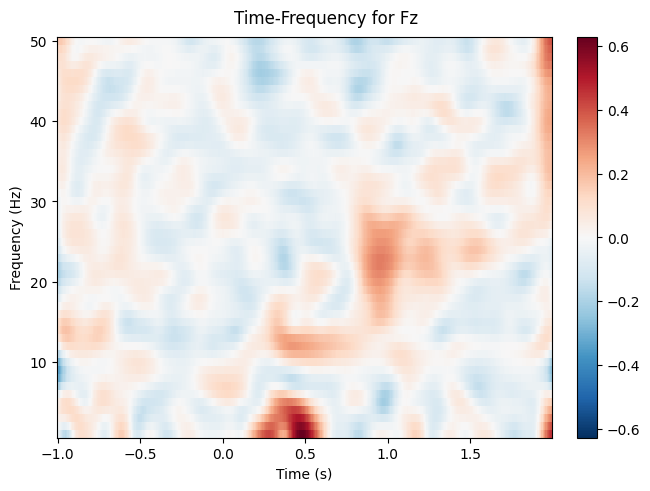

[<Figure size 640x480 with 2 Axes>]

In [60]:
from mne.time_frequency import tfr_morlet

# Define frequencies of interest (e.g., 1 to 50 Hz)
freqs = np.linspace(1, 50, 50)  # Frequencies from 1 to 50 Hz
n_cycles = freqs / 2  # Number of cycles for each frequency

# Compute the time-frequency representation for all epochs
power = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, return_itc=False)

# Plot the average time-frequency representation across all epochs for a specific channel (e.g., 'Fz')
power.plot(picks='Fz', baseline=(None, 0), mode='logratio', title="Time-Frequency for Fz")


### 7.1

In [61]:
# Save the processed epochs to a file
output_path = "processed_epochs.fif"
epochs.save(output_path, overwrite=True)
print(f"Processed epochs saved to: {output_path}")


Overwriting existing file.
Overwriting existing file.
Processed epochs saved to: processed_epochs.fif


/var/folders/r5/tmz4tmxn6s5f_cnt2d3y0pv00000gn/T/ipykernel_48657/3832553403.py:3: RuntimeWarning: This filename (processed_epochs.fif) does not conform to MNE naming conventions. All epochs files should end with -epo.fif, -epo.fif.gz, _epo.fif or _epo.fif.gz
  epochs.save(output_path, overwrite=True)


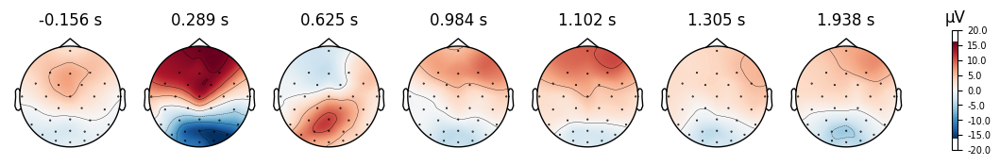

<Figure size 640x480 with 0 Axes>

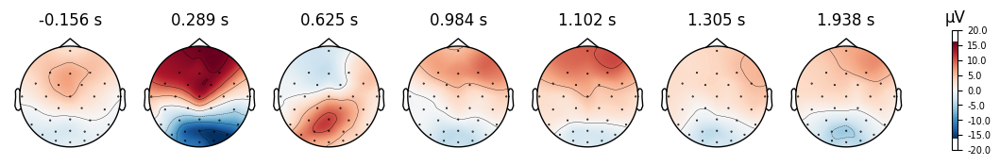

<Figure size 640x480 with 0 Axes>

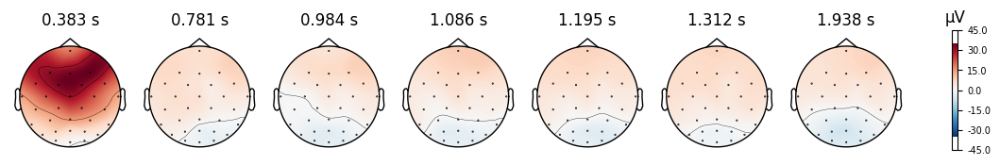

<Figure size 640x480 with 0 Axes>

In [62]:
import matplotlib.pyplot as plt

# Display scalp maps for the ERPs
for event, evoked in evokeds.items():
    fig = evoked.plot_topomap(times='peaks', time_unit='s', show=True)  # Plot scalp map
    plt.suptitle(f"Scalp Map for {event}", fontsize=16)  # Add title to the figure


In [63]:
# # Extract time-frequency data for a specific channel (e.g., Fz)
# channel_name = 'Fz'  # Specify the channel name
# channel_idx = epochs.ch_names.index(channel_name)  # Get the channel index

# # Extract the power data for this channel
# tfr_data = power.data[channel_idx]  # Shape: (frequencies, time)

# # Save the data as a CSV file
# np.savetxt(f"time_frequency_{channel_name}.csv", tfr_data, delimiter=",")
# print(f"Time-frequency data for {channel_name} exported to time_frequency_{channel_name}.csv!")


### 1. Filtering Signals

Setting up band-pass filter from 1 - 50 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 50.00 Hz
- Upper transition bandwidth: 12.50 Hz (-6 dB cutoff frequency: 56.25 Hz)
- Filter length: 423 samples (3.305 s)



/var/folders/r5/tmz4tmxn6s5f_cnt2d3y0pv00000gn/T/ipykernel_48657/1896520195.py:2: RuntimeWarning: filter_length (423) is longer than the signal (384), distortion is likely. Reduce filter length or filter a longer signal.
  raw = epochs.copy().filter(1., 50., fir_design='firwin')
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 647 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 881 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done 1151 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 1457 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done 1799 tasks      | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done 2177 tasks      | elapsed:    0.4s


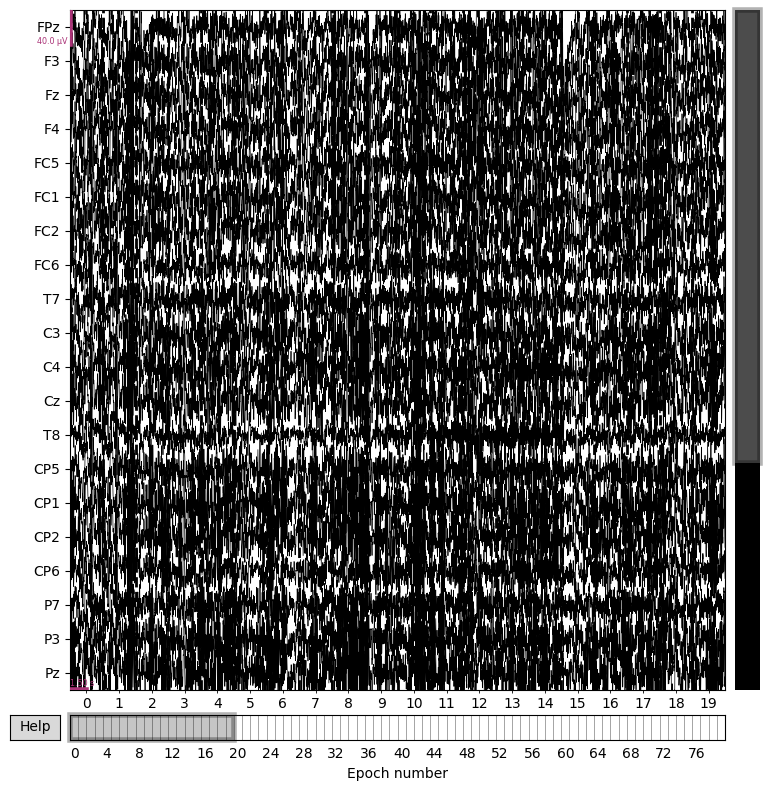

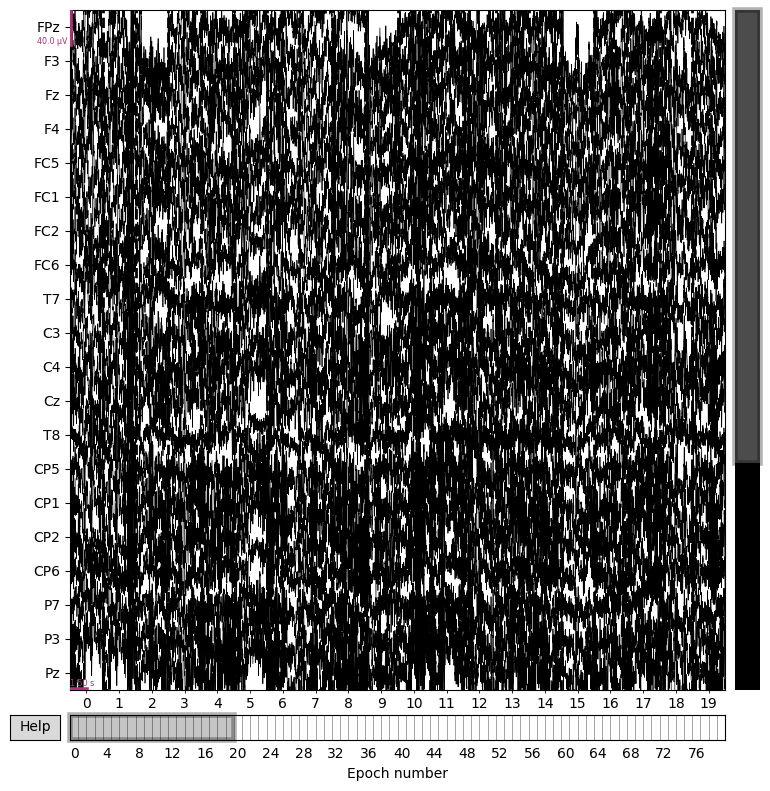

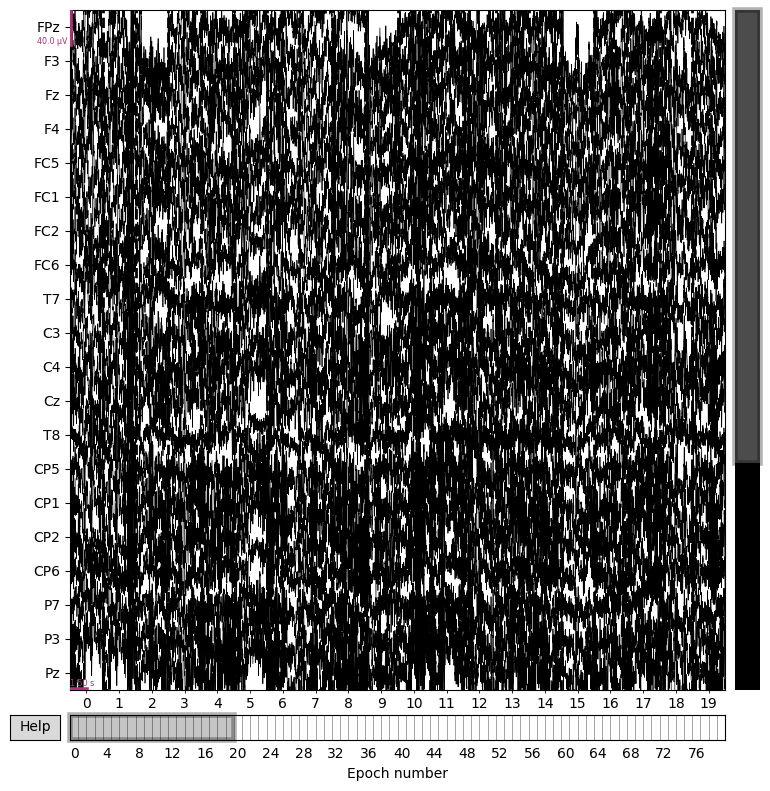

In [64]:
# Apply bandpass filtering (1-50 Hz)
raw = epochs.copy().filter(1., 50., fir_design='firwin')

# Compare signals before and after filtering
raw.plot(title="Signals After Filtering")
epochs.plot(title="Signals Before Filtering")


Fitting ICA to data using 30 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 1.0s.


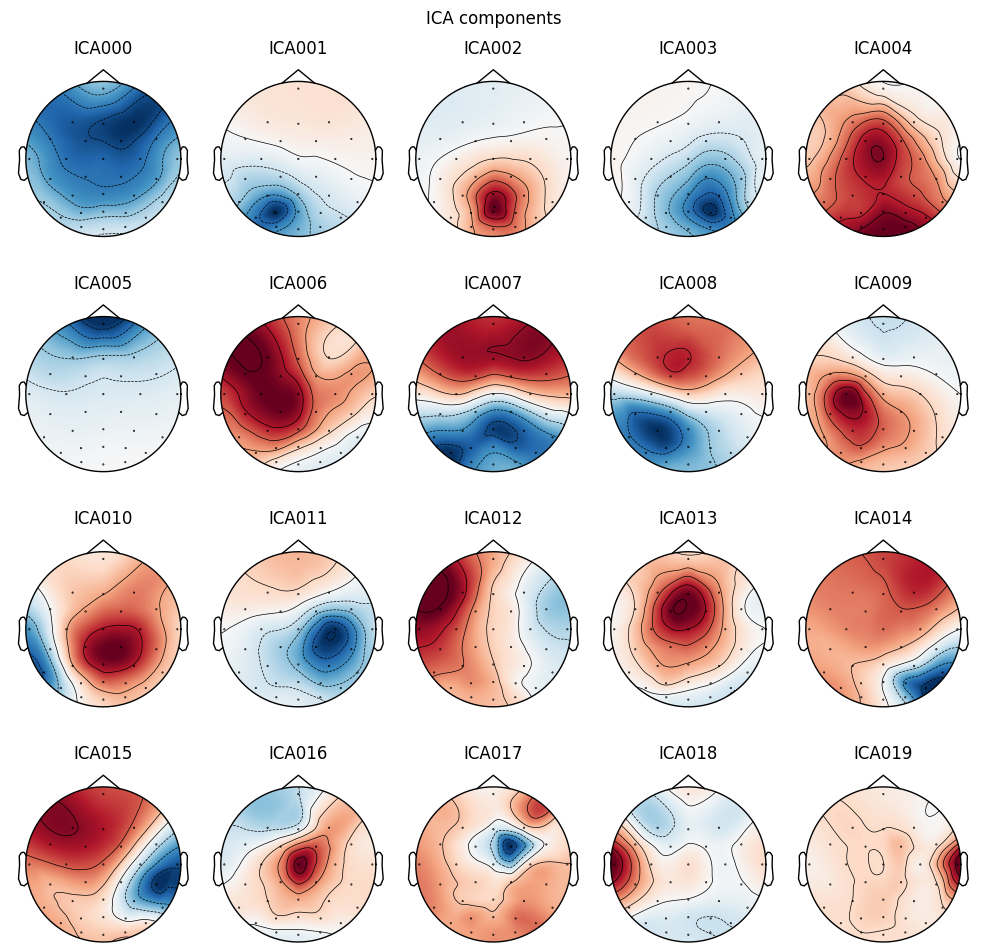

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


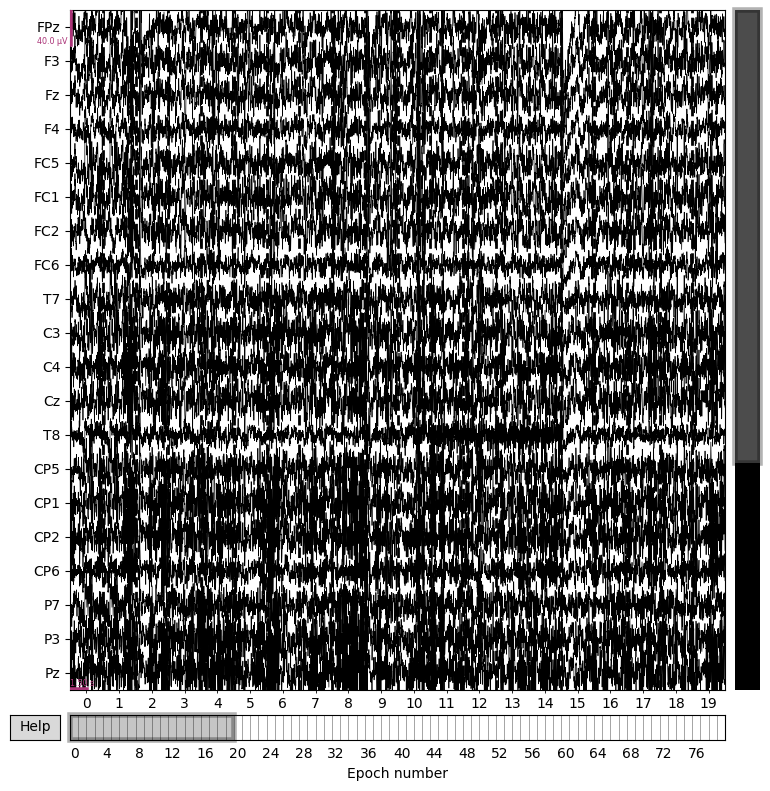

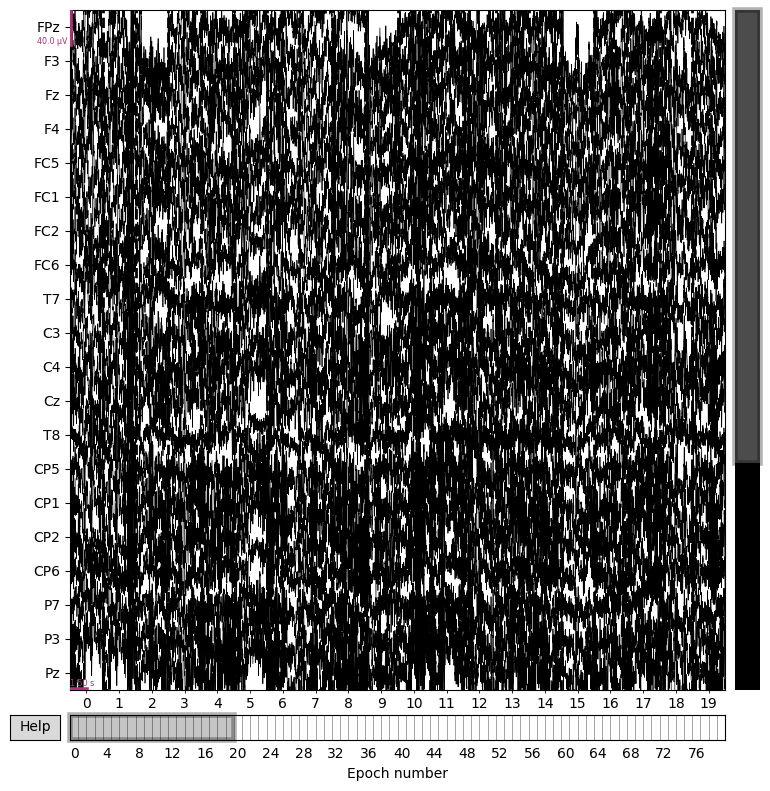

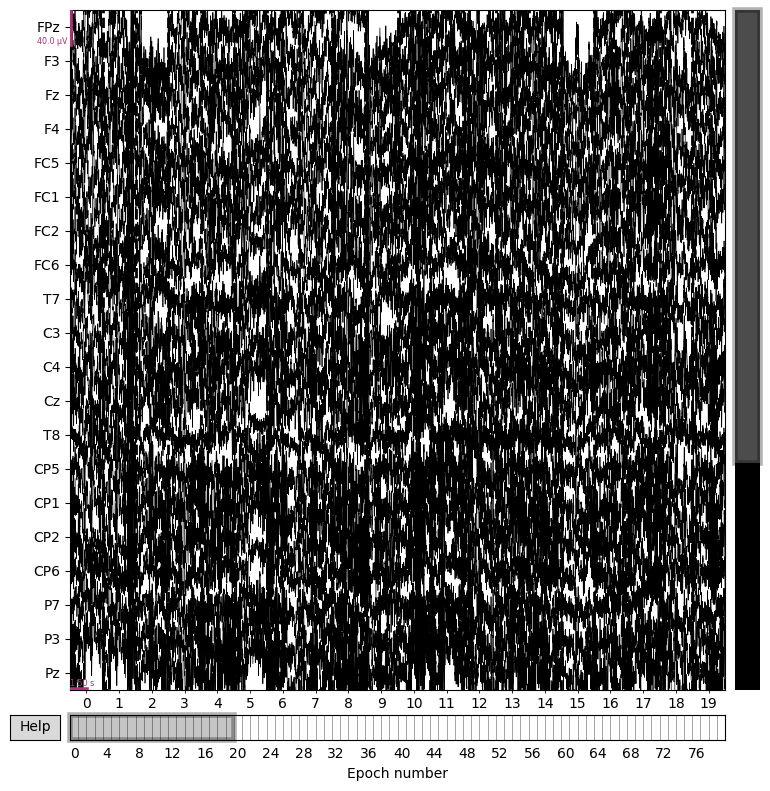

In [65]:
from mne.preprocessing import ICA

# Initialize ICA
ica = ICA(n_components=20, random_state=42, max_iter=300)

# Fit ICA to the filtered signal
ica.fit(raw)

# Plot ICA components
ica.plot_components()

# Identify and remove artifact components (e.g., EOG artifacts)
ica.exclude = [0]  # Replace with components identified as artifacts
ica.apply(raw)  # Apply ICA to remove artifacts

# Compare signals before and after ICA
raw.plot(title="Signals After ICA")
epochs.plot(title="Signals Before ICA")


In [66]:
# Count the number of channels filtered
n_channels_filtered = len(raw.info['ch_names'])
print(f"Number of signals filtered: {n_channels_filtered}")


Number of signals filtered: 32


Fitting ICA to data using 30 channels (please be patient, this may take a while)


/var/folders/r5/tmz4tmxn6s5f_cnt2d3y0pv00000gn/T/ipykernel_48657/2819916593.py:8: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(epochs)


Selecting by number: 20 components
Fitting ICA took 1.1s.


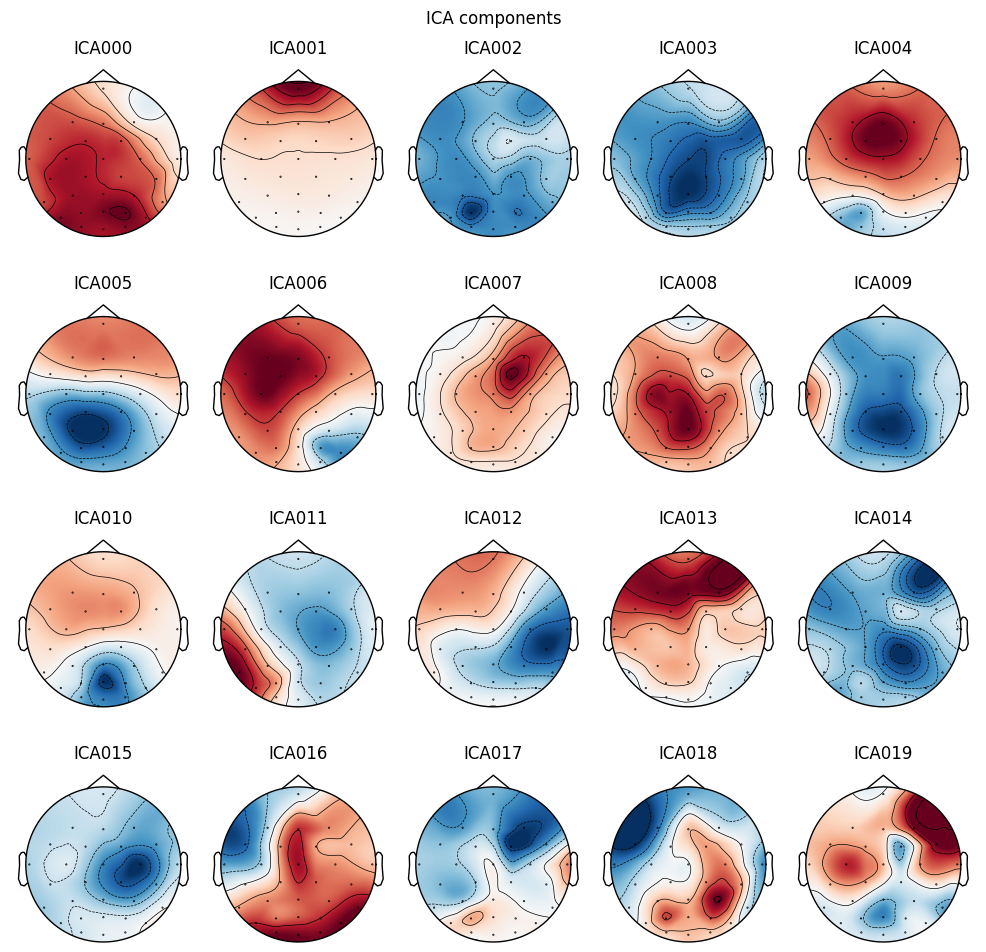

Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


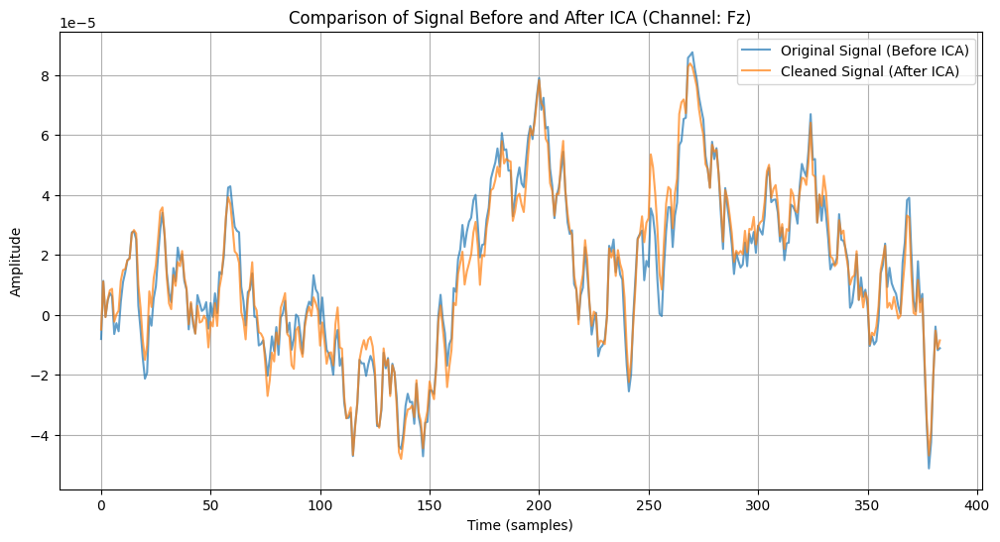

In [67]:
from mne.preprocessing import ICA
import matplotlib.pyplot as plt

# Initialize ICA
ica = ICA(n_components=20, random_state=42, max_iter=300)

# Fit ICA to the epochs
ica.fit(epochs)

# Plot the ICA components to identify artifacts
ica.plot_components()

# Exclude artifact components (manually replace with identified components)
ica.exclude = [0]  # Replace '0' with the actual artifact component index after inspection

# Save original signal for comparison
original_signal = epochs.copy().get_data(picks='Fz')[0, 0, :]

# Apply ICA to remove artifacts
ica.apply(epochs)

# Extract the cleaned signal
cleaned_signal = epochs.get_data(picks='Fz')[0, 0, :]

# Plot the original and cleaned signals
plt.figure(figsize=(12, 6))
plt.plot(original_signal, label="Original Signal (Before ICA)", alpha=0.7)
plt.plot(cleaned_signal, label="Cleaned Signal (After ICA)", alpha=0.7)
plt.title("Comparison of Signal Before and After ICA (Channel: Fz)")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.show()


NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.9s


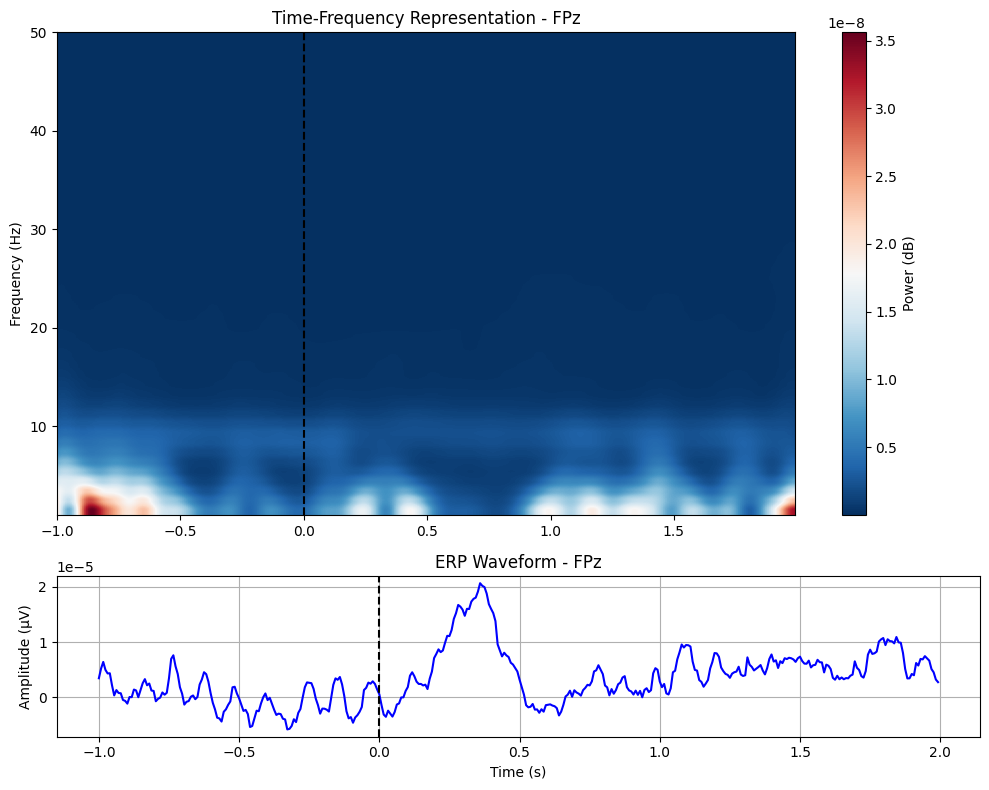

In [68]:
from mne.time_frequency import tfr_morlet
import matplotlib.pyplot as plt

# Define the channel to analyze
channel_name = 'FPz'  # Replace with the desired channel
channel_idx = epochs.ch_names.index(channel_name)

# Define frequencies of interest
freqs = np.linspace(1, 50, 50)  # Frequencies from 1 to 50 Hz
n_cycles = freqs / 2  # Number of cycles for each frequency

# Compute time-frequency representation
power = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, return_itc=False)

# Compute the ERP for the same channel
evoked = epochs.average()
erp = evoked.data[channel_idx]

# Get the time-frequency data for the selected channel
tf_data = power.data[channel_idx]

# Create the combined plot
fig, axs = plt.subplots(2, 1, figsize=(10, 8), gridspec_kw={'height_ratios': [3, 1]})

# Time-frequency plot
im = axs[0].imshow(
    tf_data, aspect='auto', origin='lower',
    extent=[epochs.times[0], epochs.times[-1], freqs[0], freqs[-1]],
    cmap='RdBu_r', vmin=tf_data.min(), vmax=tf_data.max()  # Dynamic scaling
)
axs[0].set_title(f"Time-Frequency Representation - {channel_name}")
axs[0].set_ylabel("Frequency (Hz)")
axs[0].axvline(0, color='k', linestyle='--')  # Mark time 0
fig.colorbar(im, ax=axs[0], orientation='vertical', label='Power (dB)')

# ERP plot
axs[1].plot(epochs.times, erp, color='blue')
axs[1].set_title(f"ERP Waveform - {channel_name}")
axs[1].set_xlabel("Time (s)")
axs[1].set_ylabel("Amplitude (µV)")
axs[1].axvline(0, color='k', linestyle='--')  # Mark time 0
axs[1].grid()

plt.tight_layout()
plt.show()


NOTE: tfr_morlet() is a legacy function. New code should use .compute_tfr(method="morlet").


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    3.0s


TF data shape: (50, 384)
Mean power shape: (384,)
PSD shape: (50,)


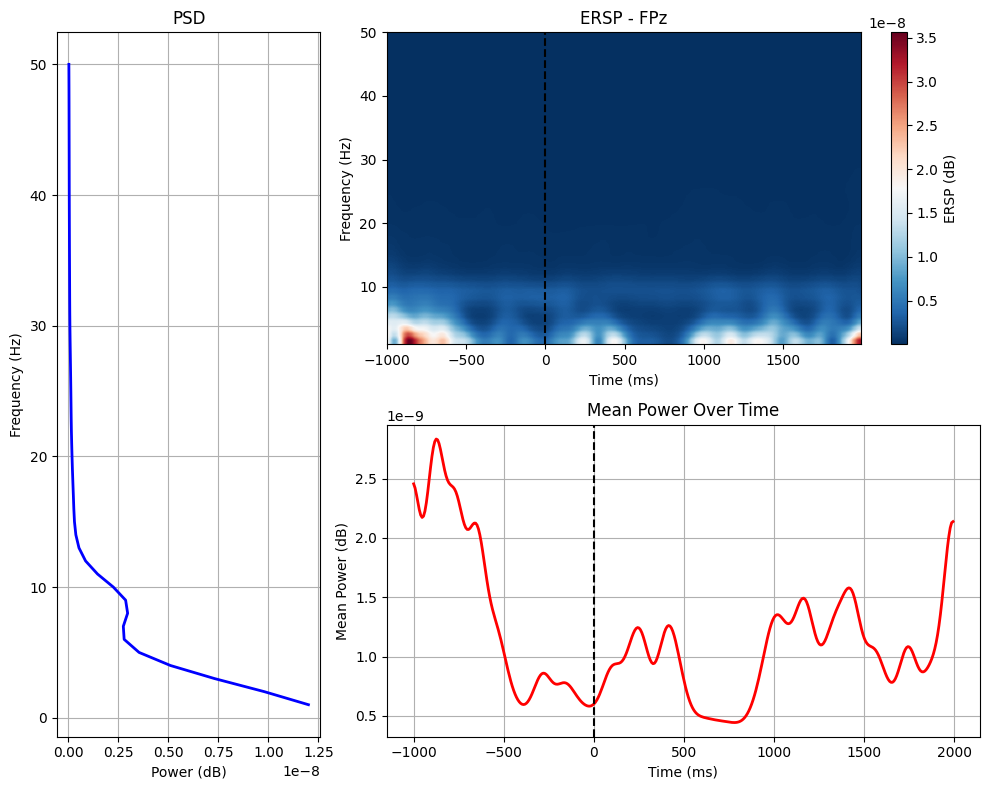

In [70]:
import numpy as np
from mne.time_frequency import tfr_morlet
import matplotlib.pyplot as plt

# Define the channel to analyze
channel_name = 'FPz'  # Replace with the desired channel
channel_idx = epochs.ch_names.index(channel_name)

# Define frequencies of interest
freqs = np.linspace(1, 50, 50)  # Frequencies from 1 to 50 Hz
n_cycles = freqs / 2  # Number of cycles for each frequency

# Compute time-frequency representation
power = tfr_morlet(epochs, freqs=freqs, n_cycles=n_cycles, return_itc=False)

# Extract the time-frequency data for the channel
tf_data = power.data[channel_idx]  # Shape: (frequencies, times)
mean_power = tf_data.mean(axis=0)  # Mean power over frequencies
psd = tf_data.mean(axis=1)  # Mean power over time

# Debugging: Check data shapes
print("TF data shape:", tf_data.shape)
print("Mean power shape:", mean_power.shape)
print("PSD shape:", psd.shape)

# Create the combined plot
fig = plt.figure(figsize=(10, 8))

# PSD plot (on the left)
ax1 = plt.subplot2grid((2, 3), (0, 0), rowspan=2)
ax1.plot(psd, freqs, color='blue', linewidth=2)
ax1.set_ylabel("Frequency (Hz)")
ax1.set_xlabel("Power (dB)")
ax1.set_title("PSD")
ax1.grid()

# Time-frequency heatmap
ax2 = plt.subplot2grid((2, 3), (0, 1), colspan=2)
im = ax2.imshow(
    tf_data, aspect='auto', origin='lower',
    extent=[epochs.times[0] * 1000, epochs.times[-1] * 1000, freqs[0], freqs[-1]],
    cmap='RdBu_r', vmin=tf_data.min(), vmax=tf_data.max()  # Dynamic scaling
)
ax2.axvline(0, color='k', linestyle='--')  # Mark event onset
ax2.set_ylabel("Frequency (Hz)")
ax2.set_xlabel("Time (ms)")
ax2.set_title(f"ERSP - {channel_name}")
fig.colorbar(im, ax=ax2, orientation='vertical', label="ERSP (dB)")

# Line plot below the heatmap
ax3 = plt.subplot2grid((2, 3), (1, 1), colspan=2)
ax3.plot(epochs.times * 1000, mean_power, color='red', linewidth=2)
ax3.axvline(0, color='k', linestyle='--')  # Mark event onset
ax3.set_ylabel("Mean Power (dB)")
ax3.set_xlabel("Time (ms)")
ax3.set_title("Mean Power Over Time")
ax3.grid()

plt.tight_layout()
plt.show()


Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


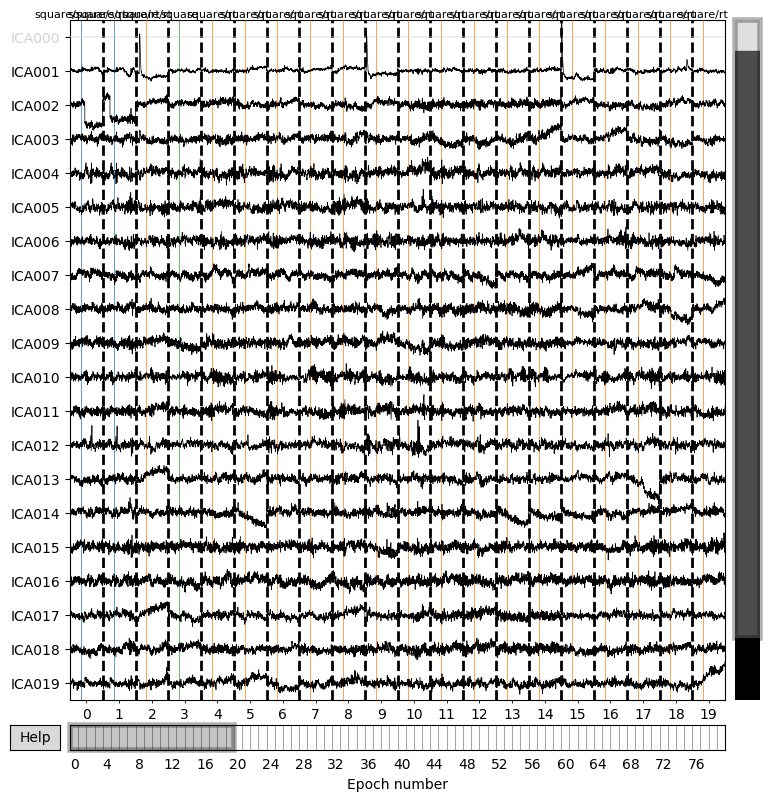

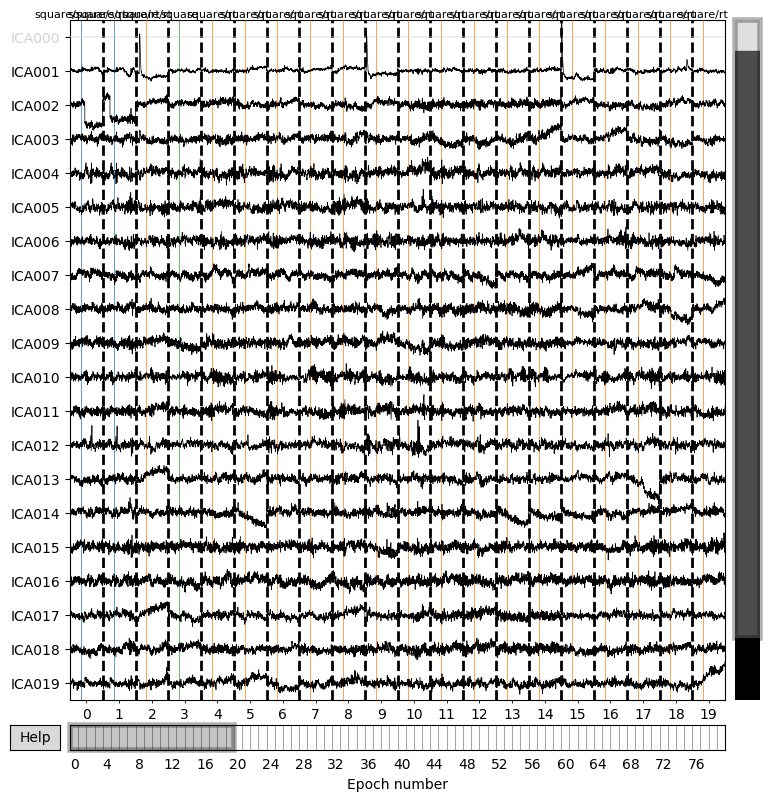

In [71]:
# Plot component spectra and maps
ica.plot_sources(epochs, title="ICA Component Sources")


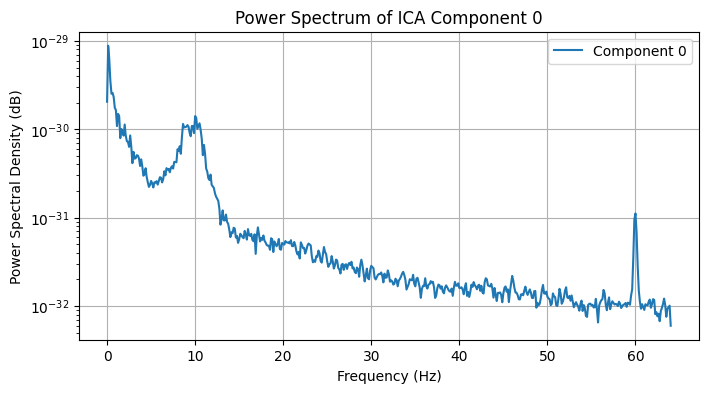

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Get the ICA sources for all components (apply ICA transform to the data)
ica_sources = ica.get_sources(epochs).get_data()

# Select the component to analyze (e.g., component 0)
component_idx = 0  # Replace with the desired component index
component_data = ica_sources[:, component_idx, :].flatten()  # Flatten across epochs

# Compute power spectrum using Welch's method
freqs, psd = welch(component_data, fs=epochs.info['sfreq'], nperseg=1024)

# Plot the power spectrum
plt.figure(figsize=(8, 4))
plt.semilogy(freqs, psd, label=f"Component {component_idx}")
plt.title(f"Power Spectrum of ICA Component {component_idx}")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power Spectral Density (dB)")
plt.grid()
plt.legend()
plt.show()


Not setting metadata
80 matching events found
No baseline correction applied
0 projection items activated


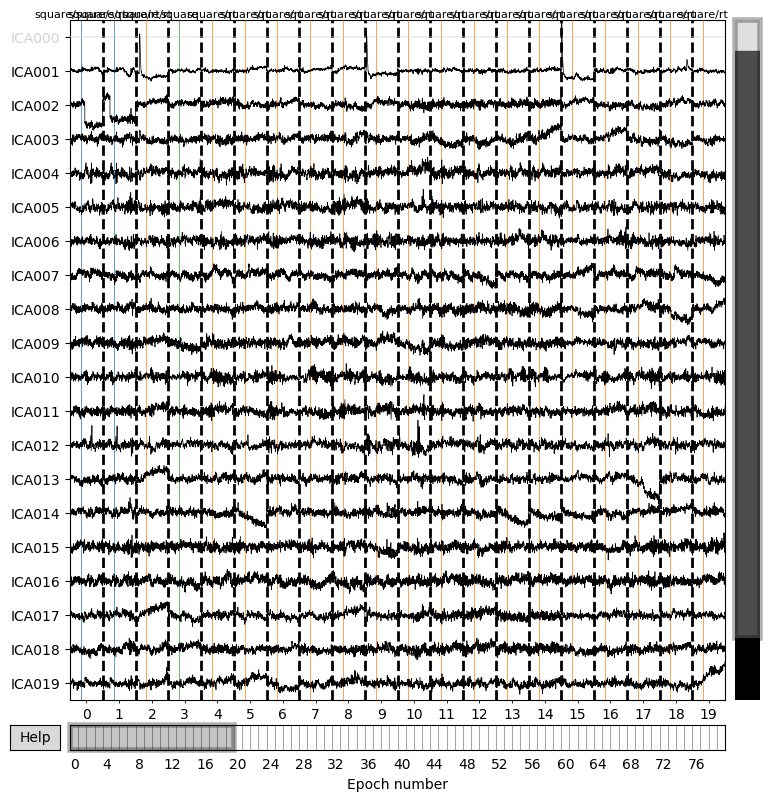

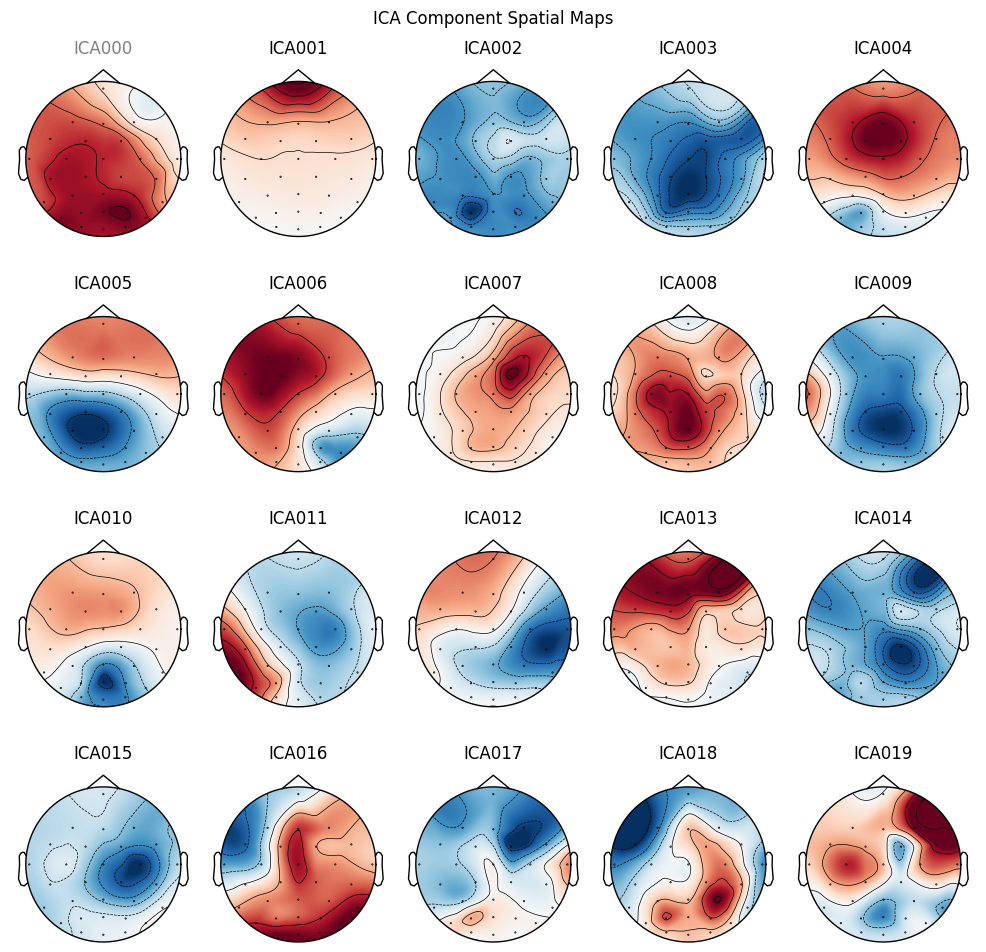

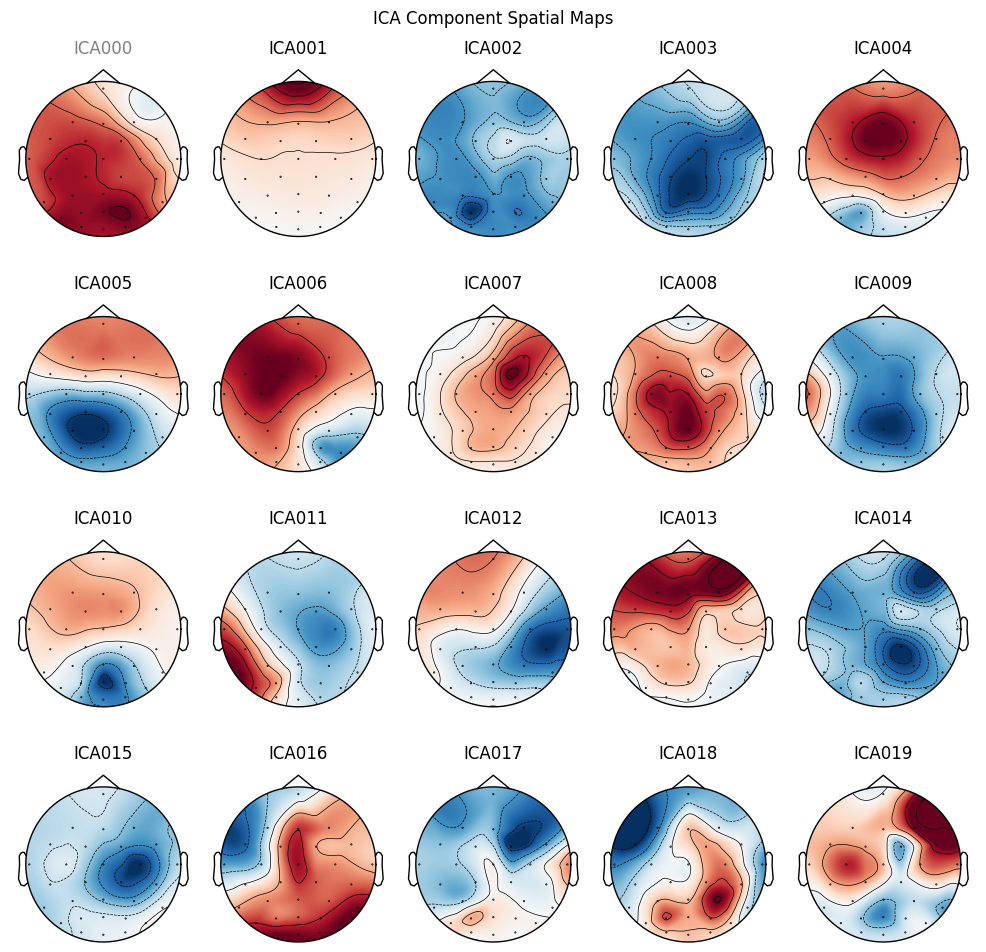

In [74]:
# Plot the ICA component sources
ica.plot_sources(epochs, title="ICA Component Sources")

# Plot spatial maps of ICA components
ica.plot_components(title="ICA Component Spatial Maps")


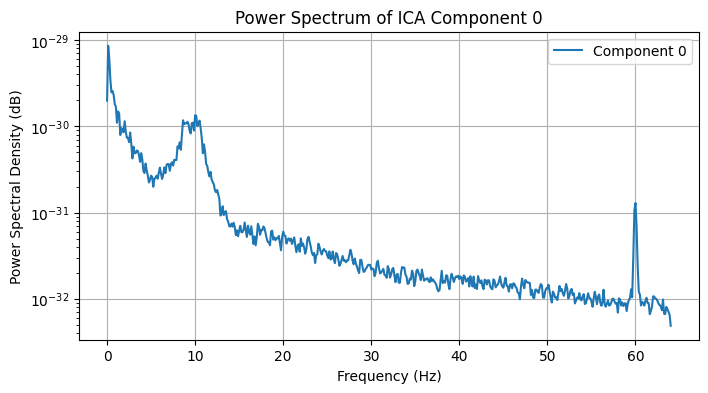

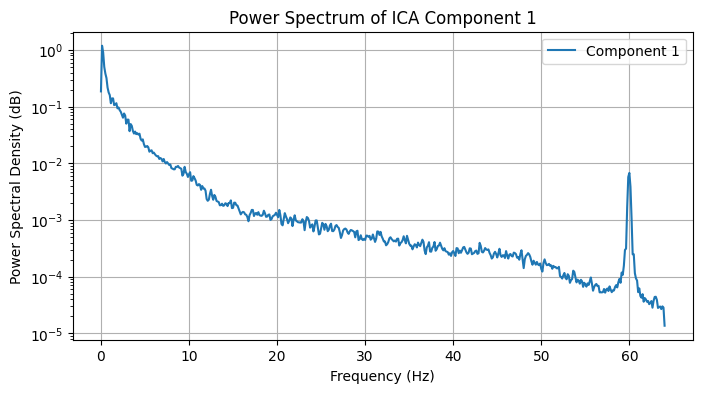

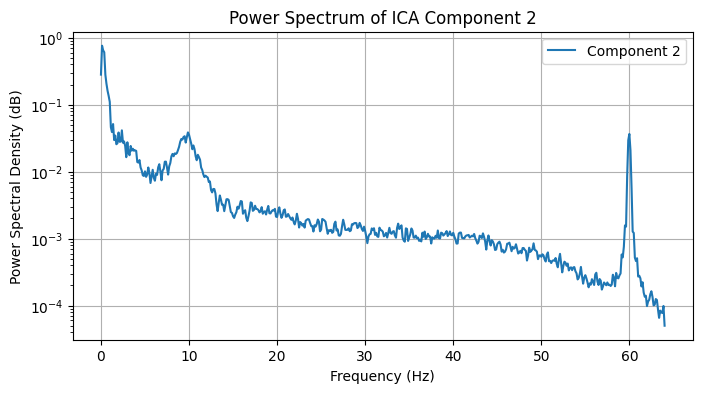

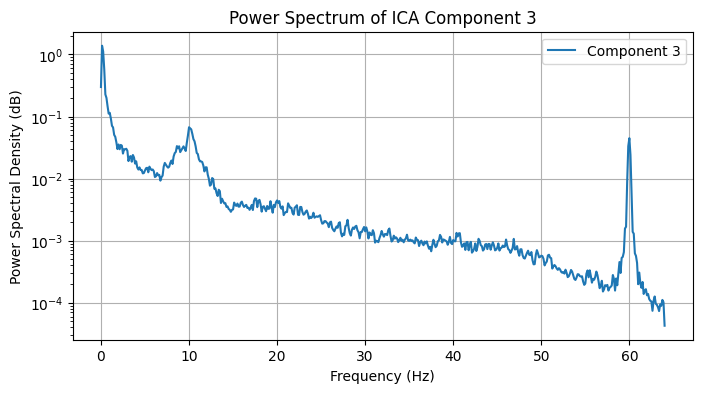

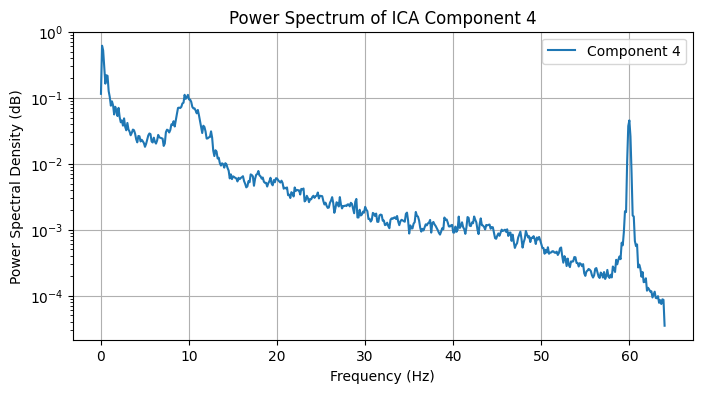

...

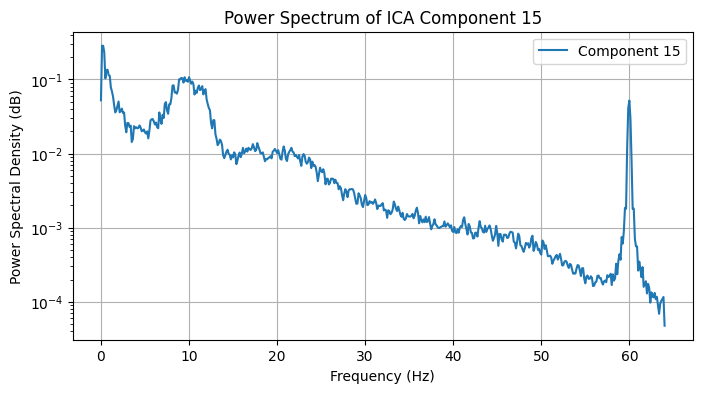

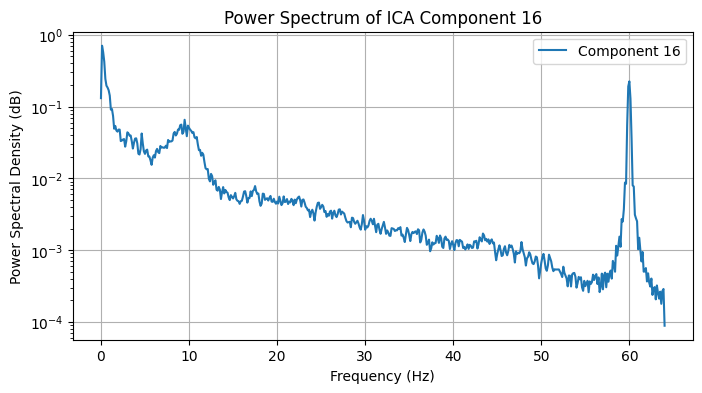

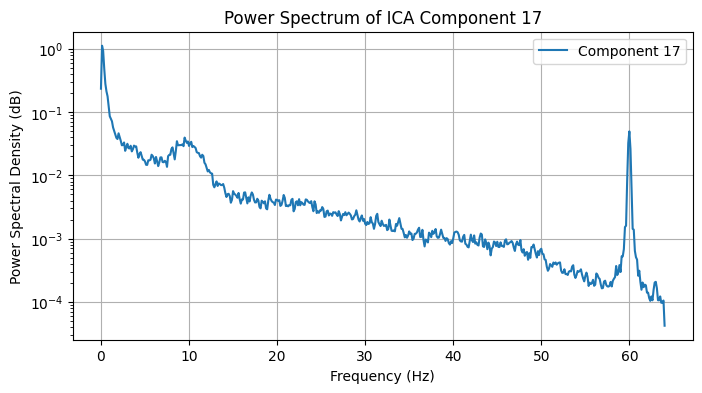

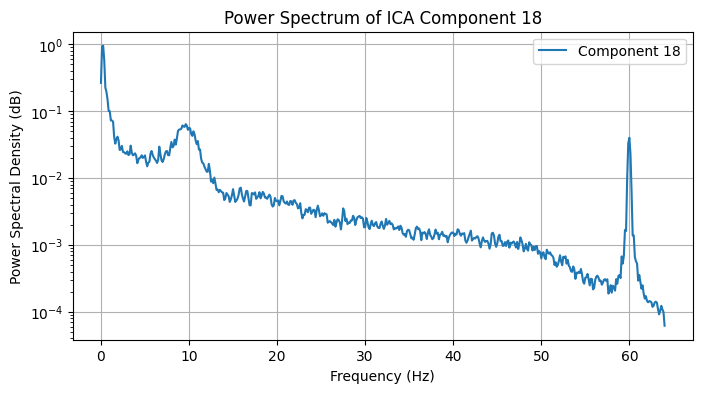

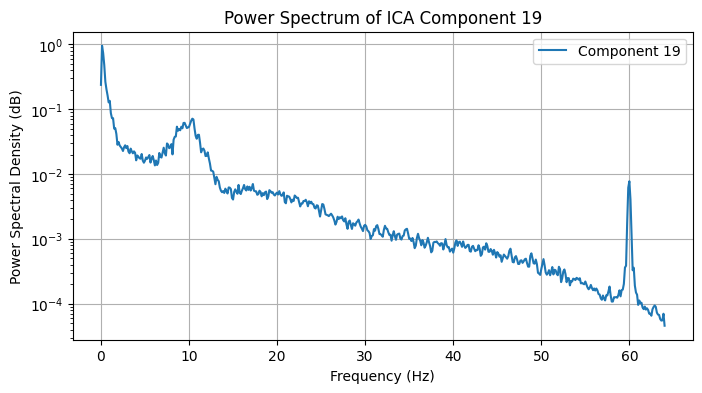

In [77]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch

# Get the number of ICA components
n_components = ica.n_components_  # Dynamically fetch the number of components

# Analyze power spectra for all components
for component_idx in range(n_components):  # Use the correct number of components
    # Get the ICA source data
    component_data = ica.get_sources(epochs).get_data()[:, component_idx, :].flatten()

    # Compute power spectrum using Welch's method
    freqs, psd = welch(component_data, fs=epochs.info['sfreq'], nperseg=1024)

    # Plot power spectrum
    plt.figure(figsize=(8, 4))
    plt.semilogy(freqs, psd, label=f"Component {component_idx}")
    plt.title(f"Power Spectrum of ICA Component {component_idx}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Power Spectral Density (dB)")
    plt.legend()
    plt.grid()
    plt.show()


Applying ICA to Epochs instance


    Transforming to ICA space (20 components)
    Zeroing out 1 ICA component
    Projecting back using 30 PCA components


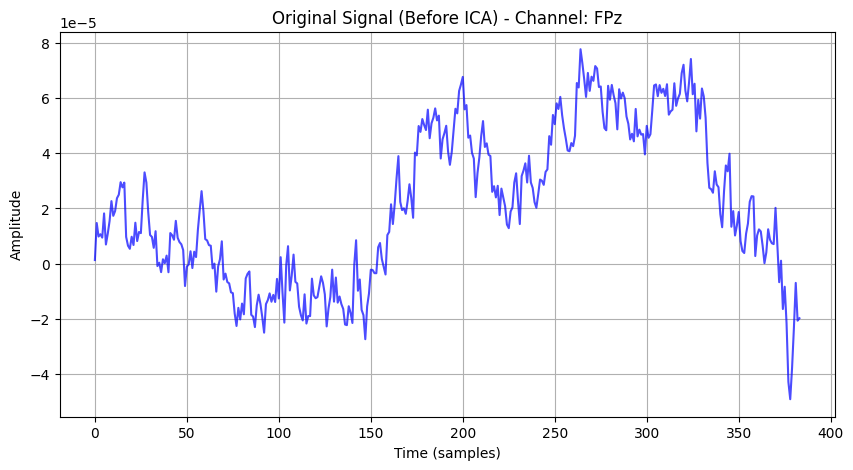

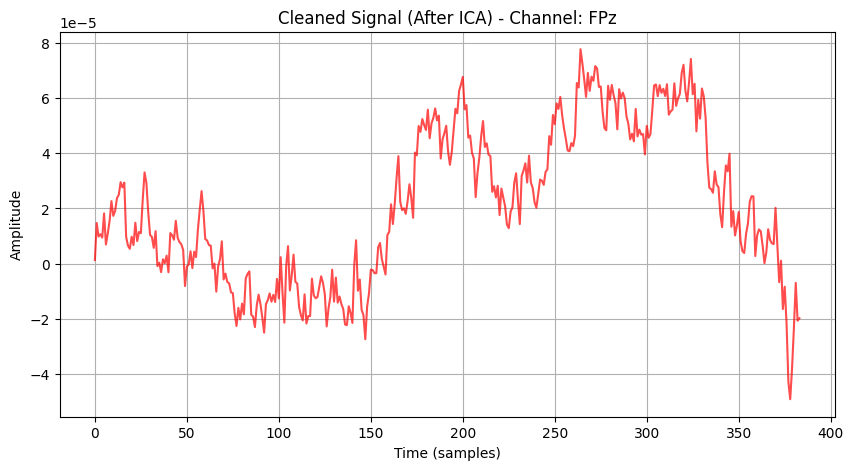

In [81]:
# Extract original signals for comparison before applying ICA
original_epochs = epochs.copy()  # Preserve a copy of the original data
original_signal = original_epochs.get_data(picks='FPz')[0, 0, :]  # Extract signal for FPz

# Apply ICA to remove artifacts
ica.apply(epochs)  # Modify the epochs in place to apply ICA

# Extract cleaned signals for comparison after applying ICA
cleaned_signal = epochs.get_data(picks='FPz')[0, 0, :]  # Extract cleaned signal for FPz

# Plot original signal
plt.figure(figsize=(10, 5))
plt.plot(original_signal, color="blue", alpha=0.7)
plt.title("Original Signal (Before ICA) - Channel: FPz")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()

# Plot cleaned signal
plt.figure(figsize=(10, 5))
plt.plot(cleaned_signal, color="red", alpha=0.7)
plt.title("Cleaned Signal (After ICA) - Channel: FPz")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")
plt.grid()
plt.show()
